In [ ]:
# importing required packages
import numpy as np
import pandas as pd
import tensorflow as tf
import math
from tensorflow import keras
from tensorflow.keras.models import Sequential 
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, Dense, MaxPooling2D, Flatten, Dropout, Activation, BatchNormalization, SpatialDropout2D
import matplotlib.pyplot as plt
import os
import PIL
import glob
import zipfile
import pathlib

from tensorflow.keras.preprocessing.image import load_img, img_to_array
from numpy import expand_dims
from tensorflow.keras.models import Model

In [ ]:
# checking if gpu available
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
!nvidia-smi

In [ ]:
# data import, only once per vm-runtime
import pathlib
dataset_url = "https://storage.googleapis.com/wandb_datasets/nature_12K.zip"
data_dir = tf.keras.utils.get_file('/root/inature_12k.zip', origin=dataset_url, extract=False)

import zipfile
with zipfile.ZipFile(data_dir, 'r') as zip_ref:
    zip_ref.extractall('/content')

3816693760/3816687935 [==============================] - 73s 0us/step


In [ ]:
# checking import
data_dir = '/content/inaturalist_12K'
data_all =  data_dir + '/train'
data_test = data_dir + '/val'

data_path = pathlib.Path(data_dir)
image_count = len(list(data_path.glob('*/*/*.jpg')))
print(image_count)

11999


In [ ]:
# getting train, val and test data

batch_size = 32
img_height = 150 # change this?
img_width = 150  # and this?
num_classes = 10

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_all,
  validation_split=0.1,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_all,
  validation_split=0.1,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_test,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


class_names = train_ds.class_names
print(class_names)

Found 9999 files belonging to 10 classes.
Using 9000 files for training.
Found 9999 files belonging to 10 classes.
Using 999 files for validation.
Found 2000 files belonging to 10 classes.
['Amphibia', 'Animalia', 'Arachnida', 'Aves', 'Fungi', 'Insecta', 'Mammalia', 'Mollusca', 'Plantae', 'Reptilia']


In [ ]:
# pre-fetching data for 
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)

# Part A:
--------------

In [ ]:
# defining data augmentation
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal", 
                                                 input_shape=(img_height, 
                                                              img_width,
                                                              3)),
    layers.experimental.preprocessing.RandomRotation(0.2),
    layers.experimental.preprocessing.RandomZoom(0.2),
    layers.experimental.preprocessing.RandomTranslation((-0.2,0.2), (-0.2, 0.2))
  ]
)


In [ ]:
# building model
def buildCNN(nFilters, ksize=[3,3,3,3,3], filterFac=1, isDataAug=False, dropout=0.0, isBN=True, denseN=256):
    model = Sequential()
    model.add(layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)))
    if isDataAug:
        model.add(data_augmentation)
    for i in range(5):
        model.add(Conv2D(math.ceil((filterFac**i) * nFilters[i]), (ksize[i], ksize[i]), padding = 'same'))
        if isBN:
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        model.add(SpatialDropout2D(dropout))
        model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dropout(dropout))
    model.add(Dense(denseN))
    model.add(Activation('relu'))
    model.add(Dense(10, activation = 'softmax'))
    return model

In [ ]:
# setup wandb sweep, don't run this cell for normal runtime
wandb.login()
sweep_config = {
    'method': 'random', #'bayes'
    'metric': {
        'name': 'val_loss',
        'goal': 'minimise'
    },
    'parameters': {
        'epochs': {
            'values': [30]
        },
        'nFil': {
            'values': [256]
        },
        'filFac':{
            'values': [0.707]
        },
        'isBN': {
            'values': [True]
        },
        'isDA': {
            'values': [False]
        },
        'dropout': {
            'values': [0.2, 0.3]
        },
        'denseN': {
            'values': [256]
        },
        'ksize1': {
            'values': [3]
        },
        'ksize2': {
            'values': [3]
        },
        'optimizer': {
            'values': ['adam', 'adamax', 'nadam', 'rmsprop']
        }
     }
}

#sweep_id = wandb.sweep(sweep_config, project="cs6910-a2")

<IPython.core.display.Javascript object>

In [ ]:
def wandb_train(config=None):
    with wandb.init(config = config):
        config = wandb.config
        nFilters = [config.nFil, config.nFil, config.nFil, config.nFil, config.nFil]
        ksize = [config.ksize1, config.ksize2, 3,3,3]
        parameters = dict(nFilters=nFilters, ksize=ksize, filterFac=config.filFac, isDataAug=config.isDA, 
                         dropout = config.dropout, isBN= config.isBN, denseN=config.denseN)
        tf.keras.backend.clear_session()
        model = buildCNN(**parameters)
        runname = str(config.nFil)+'_ksz.'+str(config.ksize1)+'.'+str(config.ksize2)+ '_opt.'+str(config.optimizer)
        runname += '_drop.'+str(config.dropout)+'_ds.'+str(config.denseN)
        wandb.run.name = runname
        model.compile(optimizer = config.optimizer, loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
        model.fit(train_ds, validation_data = val_ds, epochs=config.epochs, callbacks=[WandbCallback()])

In [ ]:
#sweep_id = 'xxdd56we'
#wandb.agent(sweep_id, wandb_train, count=5)

In [ ]:
# manual training
nFilters = [256, 181, 128, 91, 64]
ksize=[3,3,3,3,3]
tf.keras.backend.clear_session()
model = buildCNN(nFilters = nFilters, ksize=ksize, dropout = 0.3, isBN=True, isDataAug=False, denseN=256)
model.compile(optimizer = 'adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

epochs=20
history = model.fit(train_ds,  validation_data=val_ds, epochs=epochs)

In [ ]:
# plotting (from tf documentation)
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
model.evaluate(test_ds)

63/63 [==============================] - 1s 16ms/step - loss: 1.7300 - accuracy: 0.3930


[1.7300498485565186, 0.3930000066757202]


# Visualisations :
----------------


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

model = keras.models.load_model("drive/MyDrive/Sem6/DLA2/model-best.h5")

Mounted at /content/drive


In [ ]:
# evaluation on test
model.evaluate(test_ds)

63/63 [==============================] - 49s 121ms/step - loss: 1.6925 - accuracy: 0.4200


[1.6925452947616577, 0.41999998688697815]

In [ ]:
wandb.login()
wandb.init(project="cs6910-a2")
wandb.run.name = "best-model-tests"

<IPython.core.display.Javascript object>

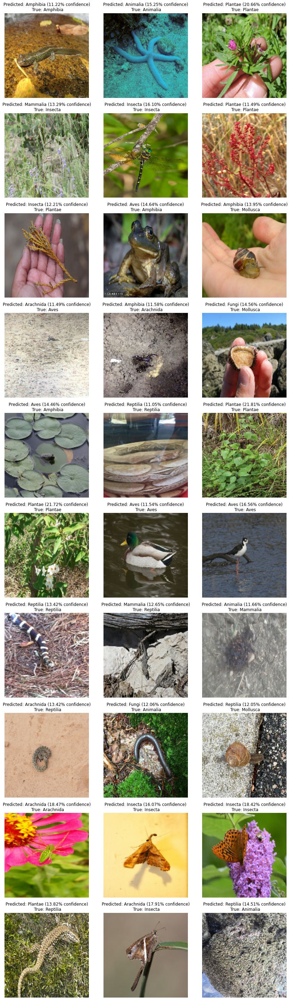

In [ ]:
# plotting image and label 
def plotImgLabel(model, test_ds, wandb=False):
    i=0
    fig, ax = plt.subplots(nrows=10, ncols=3, figsize=(12,40))
    fig.tight_layout()
    for img, label in test_ds.take(10):
        for j in range(3):
            img_array = keras.preprocessing.image.img_to_array(img[j])
            img_array = tf.expand_dims(img_array, 0) 
            predictions = model.predict(img_array)
            score = tf.nn.softmax(predictions[0])
            ax[i][j].imshow(img[j].numpy().astype("uint8"))
            ax[i][j].axis("off")
            ax[i][j].set_aspect("equal")
            ax[i][j].set_title("Predicted: {} ({:.2f}% confidence)\n True: {}".format(class_names[np.argmax(score)], 100 * np.max(score), class_names[label[j]]))
        i+=1
    if wandb == True:
        wandb.log({"PredImg" : fig})

plotImgLabel(model, test_ds)

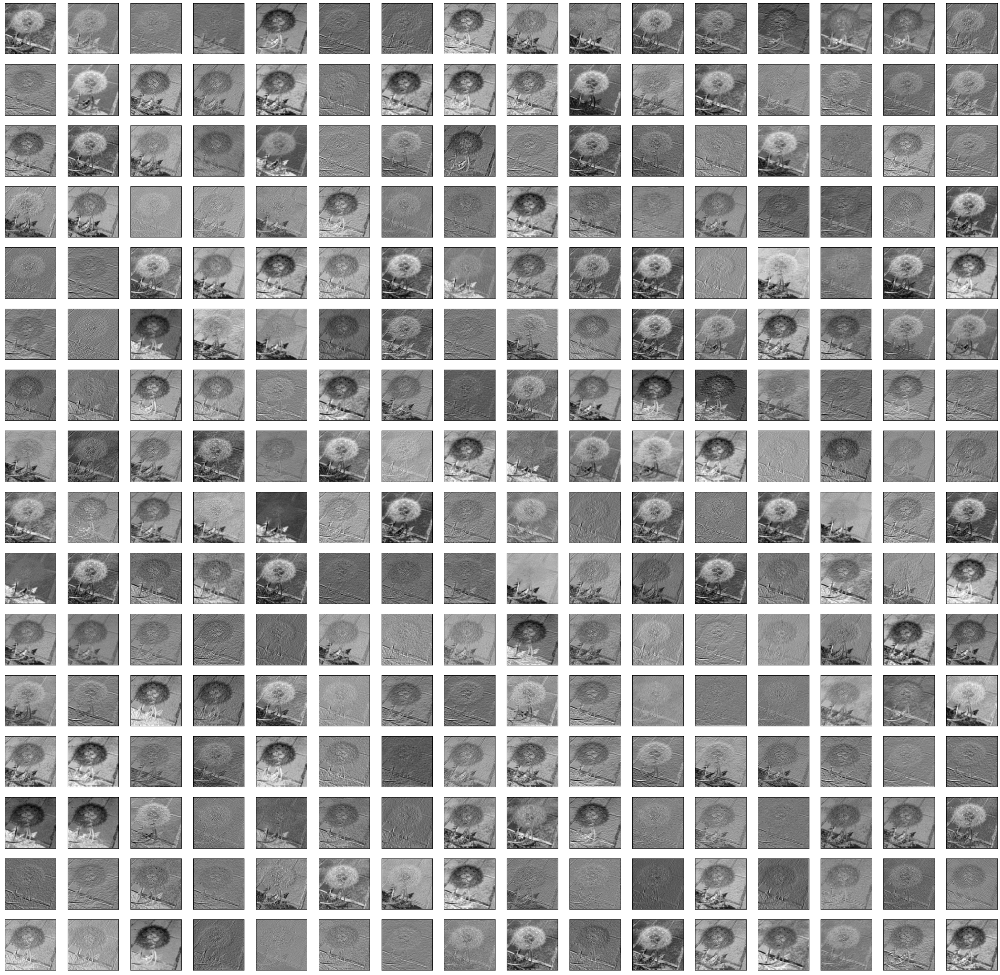

In [ ]:
# plotting filters of first layer
def plotFilters(model, test_ds, log = False):
    for img, label in test_ds.take(1):
        model1 = Model(inputs=model.inputs, outputs=model.layers[1].output)
        img_array = img_to_array(img[0])
        img_array = expand_dims(img_array, axis=0)

        # get feature map for first hidden layer
        feature_maps = model1.predict(img_array)
        ix = 1
        plt.figure(figsize=(40,40))
        for _ in range(16):
            for _ in range(16):
                ax = plt.subplot(16, 16, ix)
                ax.set_xticks([])
                ax.set_yticks([])
                plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
                ix+=1
        # show the figure
        if log == True:
            wandb.log({"Filters": plt})
        plt.show()

plotFilters(model, test_ds)

In [ ]:
from tensorflow.keras import backend as K

def deprocess_image(x):
    """Same normalization as in:
    https://github.com/fchollet/keras/blob/master/examples/conv_filter_visualization.py
    """
    # normalize tensor: center on 0., ensure std is 0.25
    x = x.copy()
    x -= x.mean()
    x /= (x.std() + K.epsilon())
    x *= 0.25
    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)
    # convert to RGB array
    x *= 255
    if K.image_data_format() == 'channels_first':
        x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def guidedBackprop(model, test_ds, layer_name, log = False):
    # model till 5th convolutional layer
    model_conv5 = Model(inputs = model.inputs, outputs = model.get_layer(layer_name).output)
    #print(model_conv5.summary())

    # creating a custom gradient (from stackoverflow)
    @tf.custom_gradient
    def guidedReLU(x):
        def grad(dy):
            return tf.cast(dy>0, "float32") * tf.cast(x>0, "float32") * dy
        return tf.nn.relu(x), grad

    # setting activation to guidedReLU
    for layer in model.layers:
        if hasattr(layer, 'activation') and layer.activation==tf.keras.activations.relu:
            layer.activation = guidedReLU

    # computing and plotting
    fig, axs = plt.subplots(12, 1, figsize=(4, 44))
    for img, label in test_ds.take(1):
        img_array = tf.convert_to_tensor(img, dtype=tf.float32)
        with tf.GradientTape() as tape:
            inp = tf.expand_dims(img_array[0], 0)
            tape.watch(inp)
            out = model_conv5(inp)[0]
        gradients = tape.gradient(out, inp)[0]
        axs[0].set_title("Image")
        axs[0].imshow(img_array[0]/255.0)
        axs[0].axis("off")
        axs[1].set_title("Guided-Backprop on full layer")
        axs[1].imshow(np.flip(deprocess_image(np.array(gradients)),-1)) 
        axs[1].axis("off")
        for i in range(10):
            with tf.GradientTape() as tape:
                inp = tf.expand_dims(img_array[0], 0)
                tape.watch(inp)
                out = model_conv5(inp)[0,:,:,6*i]
            gradients = tape.gradient(out, inp)[0]
            axs[i+2].set_title("Guided-Backprop, neuron {}".format(6*i+1))
            axs[i+2].imshow(np.flip(deprocess_image(np.array(gradients)),-1)) 
            axs[i+2].axis("off")
    if log == True:
        wandb.log({"Guided" : plt})
    plt.show()
    
model = keras.models.load_model("drive/MyDrive/Sem6/DLA2/model-best-A.h5")
guidedBackprop(model, test_ds, "activation_4") #conv2d_4